# generate masks from study

In [ ]:
import nibabel as nib

from nilearn.input_data import NiftiMasker , MultiNiftiMasker, NiftiLabelsMasker
import nilearn as nil
import numpy as np 
import os
import os.path
import scipy.io
import nibabel as nib
from nilearn.input_data import NiftiMasker
from nilearn.masking import compute_epi_mask
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import PredefinedSplit
from copy import deepcopy
import warnings
import sys  
import random
# import logging

import deepdish as dd
import numpy as np

import brainiak.eventseg.event
import nibabel as nib
from nilearn.input_data import NiftiMasker

import scipy.io
from scipy import stats
from scipy.stats import norm, zscore, pearsonr
from scipy.signal import gaussian, convolve
from sklearn import decomposition
from sklearn.model_selection import LeaveOneOut, KFold

from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.patches as patches
import seaborn as sns 

%autosave 5
%matplotlib inline
sns.set(style = 'white', context='talk', font_scale=1, rc={"lines.linewidth": 2})

if not sys.warnoptions:
    warnings.simplefilter("ignore")

"""
from utils import sherlock_h5_data

if not os.path.exists(sherlock_h5_data):
    os.makedirs(sherlock_h5_data)
    print('Make dir: ', sherlock_h5_data)
else: 
    print('Data path exists')
    
from utils import sherlock_dir
"""

random.seed(10)
%matplotlib inline
from brainiak import image, io
from scipy.stats import stats
import nibabel as nib
import numpy as np
from matplotlib import pyplot as plt
from brainiak import image, io
import matplotlib.pyplot as plt
from sklearn.datasets import load_digits
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.svm import LinearSVC
from sklearn.decomposition import PCA, NMF
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GroupShuffleSplit
from sklearn.model_selection import LeavePGroupsOut
from nilearn.input_data import NiftiMasker
import pandas as pd
# Import machine learning libraries
from nilearn.input_data import NiftiMasker
from sklearn import preprocessing
from sklearn.model_selection import GridSearchCV, PredefinedSplit
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.feature_selection import VarianceThreshold, f_classif, SelectKBest
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from scipy.stats import sem
from copy import deepcopy
from sklearn.metrics import roc_auc_score
import statistics
# Visualize it as an ROI
from nilearn.plotting import plot_roi
#plot_roi(x)
from nilearn.image import concat_imgs, resample_img, mean_img
from nilearn.plotting import view_img
from nilearn import datasets, plotting
from nilearn.input_data import NiftiSpheresMasker

from nilearn.glm.first_level import FirstLevelModel
from nilearn.glm.first_level import make_first_level_design_matrix
from nilearn.image import concat_imgs, resample_img, mean_img,index_img
from nilearn import image
from nilearn import masking
from nilearn.plotting import view_img
from nilearn.image import resample_to_img
from scipy.spatial.distance import squareform
# Visualize it as an ROI
from nilearn.plotting import plot_roi
import statsmodels.stats.multitest as st
from nilearn import connectome
from nilearn import image
from scipy.spatial.distance import squareform
from sklearn.model_selection import LeaveOneOut, KFold
from sklearn.model_selection import LeavePGroupsOut
from sklearn.model_selection import LeaveOneGroupOut
from nilearn import input_data
from nilearn.plotting import plot_glass_brain
from nilearn.masking import apply_mask
import random
from nilearn.image import concat_imgs, resample_img, mean_img
from utils import intersect_mask

In [ ]:
%matplotlib inline


# Functions 

# Dirs

In [5]:

data_dir = '../../data/bids' # where the fMRI data is downloaded
rois_dir = ... # not specified 
behav_p = '../behavioral/stim_list'
load_bpress = "/jukebox/graziano/coolCatIsaac/ATM/data/work/results/bpress_GLM/behav"
load_fmri = "/jukebox/graziano/coolCatIsaac/ATM/data/work/results/bpress_GLM/"
out_dir = "../../data/output" # where to save the directory
confounds_dir = '../behavioral_data/confound_info/'
parc_dir = "//schaef_par/MNI/"


# Start GLM

In [7]:
sub_list = ["sub-000", "sub-001","sub-002","sub-003","sub-004","sub-005","sub-006","sub-007","sub-008",
            "sub-009","sub-010","sub-011","sub-012","sub-013","sub-014","sub-015", "sub-016","sub-017", 
            "sub-018", "sub-019", "sub-020","sub-021"]

sub_list = ["sub-000", 'sub-001', 'sub-015']
sub_list = ["sub-015", "sub-016","sub-017", "sub-018", "sub-019", "sub-020","sub-021", "sub-021"]
sub_list = ["sub-000", "sub-001","sub-002","sub-003","sub-004","sub-005","sub-006","sub-007","sub-008",
            "sub-009","sub-010","sub-011","sub-012","sub-013","sub-014","sub-015", "sub-016","sub-017", 
            "sub-018", "sub-019", 'sub-020', 'sub-021']
#sub_list = ["sub-015"]

cond_a = 'SM'
cond_b = 'SC'

In [8]:
suffix = "_205_noproc.npy"

def load_smsc_fmri(sub,behav_p,cond_a,cond_b,suffix):
    """
    read in target conditions + subject info
    output: 2 runs of condition A, as they were presented, then two runs of condition B
    """
    cats = list(np.load(load_fmri + sub + suffix, allow_pickle =True)) 
    # Find run labels from behavioral data
    lab_indic = fnd_indices(sub, behav_p)
    # Organize and concatenate bold data
    return org_bdata(cats, lab_indic, cond_a, cond_b)

In [22]:
from utils import label_lists, find_cond_index, load_epi_data, load_roi_mask,intersect_mask

In [10]:
def fnd_indices(sub,behav_p):
    behav = pd.read_csv(os.path.join(behav_p, '%s_behav_cleaned.csv') % (sub))
    # Define the column in behav to be used for creating labels # 
    label = behav.iloc[:,1]
    # Create an array of labels [1] AND the order in which runs occured [0]#
    sub_ses_labels = label_lists(label, 200)
    ## Find run sequence, extraction condition indexes from behav data ## 
    return find_cond_index(sub_ses_labels[0])

In [11]:
def org_bdata(unsort_bdata, run_indexes, cond_a, cond_b): 
    """
    organize two runs for concatenation
    Two runs of cond_a, then two runs of cond_b
    
    """
    bold_data = []
    a = [unsort_bdata[run_indexes[cond_a][0]], unsort_bdata[run_indexes[cond_a][1]]]
    b = [unsort_bdata[run_indexes[cond_b][0]], unsort_bdata[run_indexes[cond_b][1]]]
    print("concatenated", cond_a, cond_b)
    return a + b

In [12]:
def intersect_gm_mask(sub, num_runs,reg, ses="ses-01",task="Attn"):
    # This is based off of 'load_data' function in template
    # Loads all fMRI runs into a matrix #
    """
    reg = T1 or MNI registration?
    norm_type = by Space or by Time? 
    """
    yoz = []
    print("Begin intersecting, you sexy beast")
    for run in range(1, num_runs + 1):
        # Load epi data 
        epi = load_epi_data(sub,ses,task,run,reg)
        # Load ROI data
        roi_samp = compute_epi_mask(epi, mask_type='gm')
     #   print(roi_samp)
        #nifti_masker = NiftiMasker(mask_img=roi_samp)
        #maskedData = nifti_masker.fit_transform(epi)
        yoz.append(roi_samp)
    #print(concatenated_data)
    epi_data = nil.masking.intersect_masks(yoz)
    print("all done wit da intersextion (lol)")

    return epi_data

In [13]:
cond_a = 'SM'
cond_b = 'SC'

# mni template

In [26]:
def load_epi_data(sub, ses, task,run, space):
  # Load MRI file
    if space == "MNI":
        epi_in = os.path.join(data_dir, sub, ses, 'func', "%s_%s_task-%s_run-%s_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz" % (sub, ses, task,run))
    elif space == "T1":
        epi_in = os.path.join(data_dir, sub, ses, 'func', "%s_%s_task-%s_run-%s_space-T1w_desc-preproc_bold.nii.gz" % (sub, ses, task,run))
    else:
        print("wrong load epi input. check this function")
    epi_data = nib.load(epi_in)
    print(epi_data.shape)
    print("Loading data from %s" % (epi_in))
    return epi_data

In [14]:
#https://brainiak.org/notebooks/tutorials/html/01-setup.html

In [24]:
import brainiak.utils.fmrisim as sim  


In [28]:
d = load_epi_data('sub-000', 'ses-01', "Attn",1, "MNI")
# Get parcellation fdata
aparc = d.get_fdata()

(78, 93, 65, 209)
Loading data from /jukebox/graziano/coolCatIsaac/ATM/data/bids/derivatives/fmriprep/sub-000/ses-01/func/sub-000_ses-01_task-Attn_run-1_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz


In [17]:
# Set the size (in terms of X, Y, Z) of the volume we want to create
dimensions = np.asarray([78, 93, 65])

# Generate an anatomical image with the size above of brain voxels in gray matter
# This outputs variables for two versions of the image, binary (mask) and probabilistic (template)
mask, template = sim.mask_brain(dimensions, mask_self=False)

In [29]:
mask_img = nib.Nifti1Image(mask, affine=d.affine,header=d.header)

In [31]:
temp_img = nib.Nifti1Image(template, affine=d.affine,header=d.header)


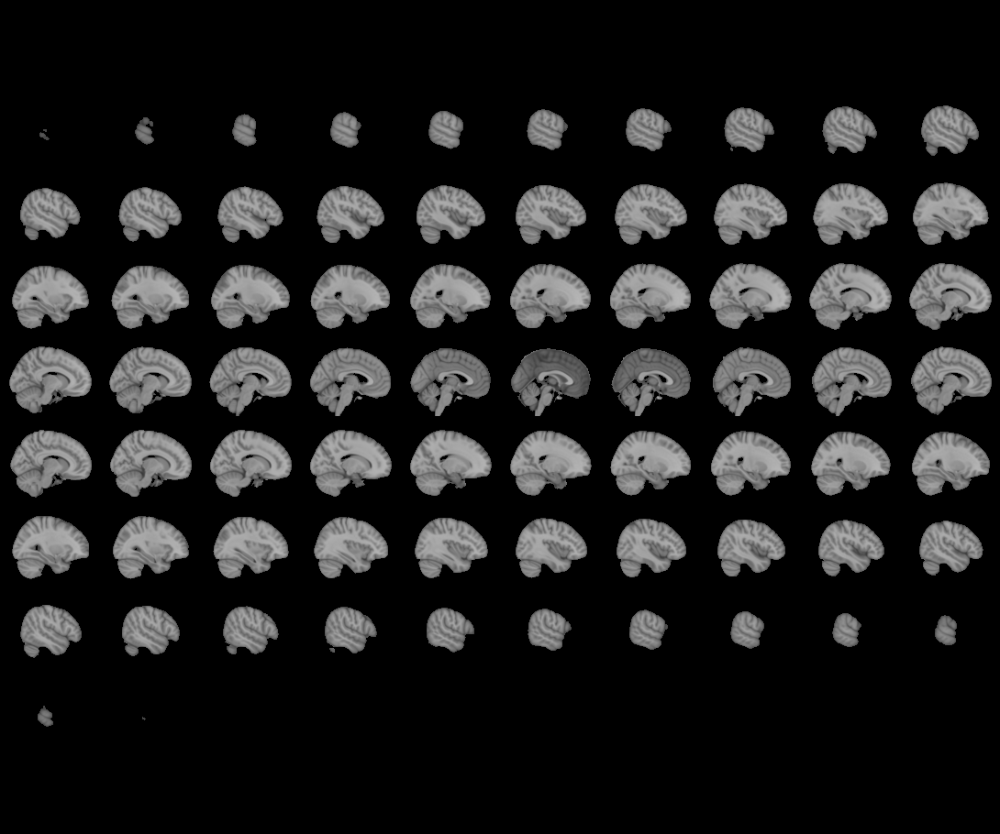
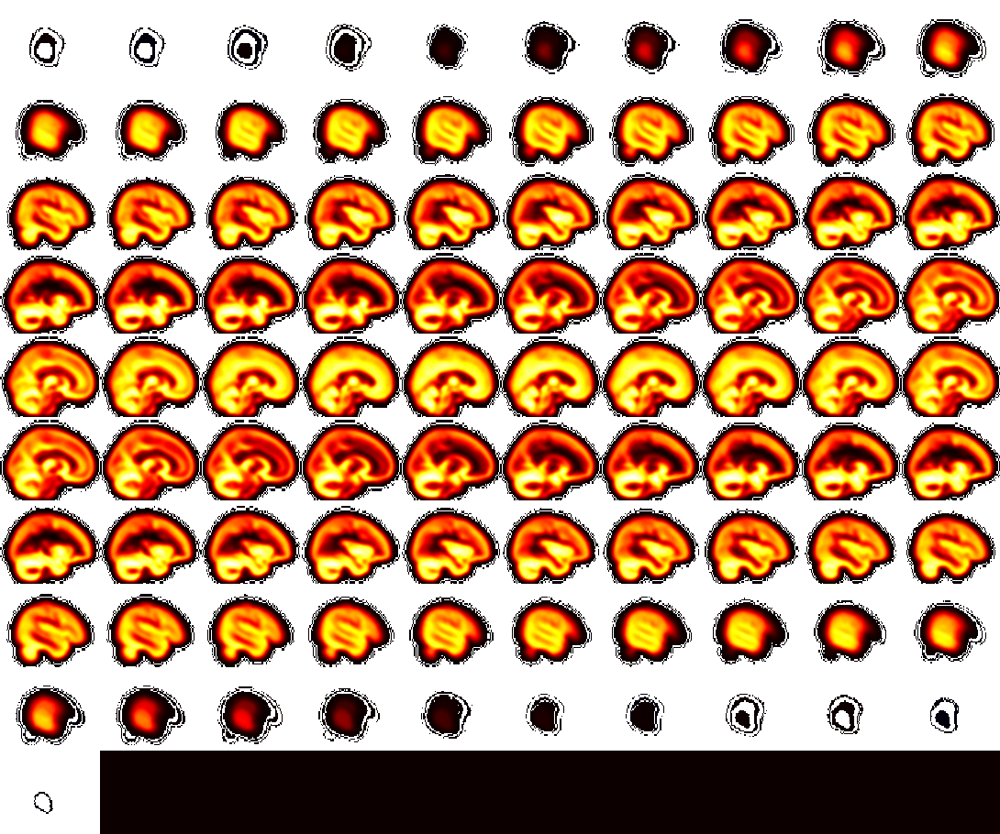

In [32]:
view_img(temp_img)

# Grey Matter Schaef

Creates th grey matter mask used in the study from the Schaeffer Parcellation scheme

In [43]:
all_schaf = np.arange(1,201)

In [44]:
d = nib.load(os.path.join(parc_dir + "Schaefer2018_100Parcels_7Networks_order_FSLMNI152_2mm.nii.gz"))
# Get parcellation fdata
aparc = d.get_fdata()
# paracellations scheme
print(np.unique(d.get_fdata()))
print("shape of d object", d.shape)
print("num voxels in one parcel:", np.sum(aparc == 50))

# Create an empty that is the shape of d
roi_tem1 = np.zeros(d.shape)
# Set all target regions = 1
for idx, roi_num in enumerate(all_schaf):
    print("Begin Parc", roi_num)
    # set all cases where parcel is equal to roi_num, equal to one, everything else zero (creates a mask)
    #roi_tem[aparc == roi_num] = idx
    # Set all target regions = 1
    roi_tem1[aparc == roi_num] = 1


[  0.   1.   2.   3.   4.   5.   6.   7.   8.   9.  10.  11.  12.  13.
  14.  15.  16.  17.  18.  19.  20.  21.  22.  23.  24.  25.  26.  27.
  28.  29.  30.  31.  32.  33.  34.  35.  36.  37.  38.  39.  40.  41.
  42.  43.  44.  45.  46.  47.  48.  49.  50.  51.  52.  53.  54.  55.
  56.  57.  58.  59.  60.  61.  62.  63.  64.  65.  66.  67.  68.  69.
  70.  71.  72.  73.  74.  75.  76.  77.  78.  79.  80.  81.  82.  83.
  84.  85.  86.  87.  88.  89.  90.  91.  92.  93.  94.  95.  96.  97.
  98.  99. 100.]
shape of d object (91, 109, 91)
num voxels in one parcel: 1315
Begin Parc 1
Begin Parc 2
Begin Parc 3
Begin Parc 4
Begin Parc 5
Begin Parc 6
Begin Parc 7
Begin Parc 8
Begin Parc 9
Begin Parc 10
Begin Parc 11
Begin Parc 12
Begin Parc 13
Begin Parc 14
Begin Parc 15
Begin Parc 16
Begin Parc 17
Begin Parc 18
Begin Parc 19
Begin Parc 20
Begin Parc 21
Begin Parc 22
Begin Parc 23
Begin Parc 24
Begin Parc 25
Begin Parc 26
Begin Parc 27
Begin Parc 28
Begin Parc 29
Begin Parc 30
Begin Parc 3

In [38]:
#roi_tem1 = np.zeros(d.shape)
int_mask.shape

(78, 93, 65)


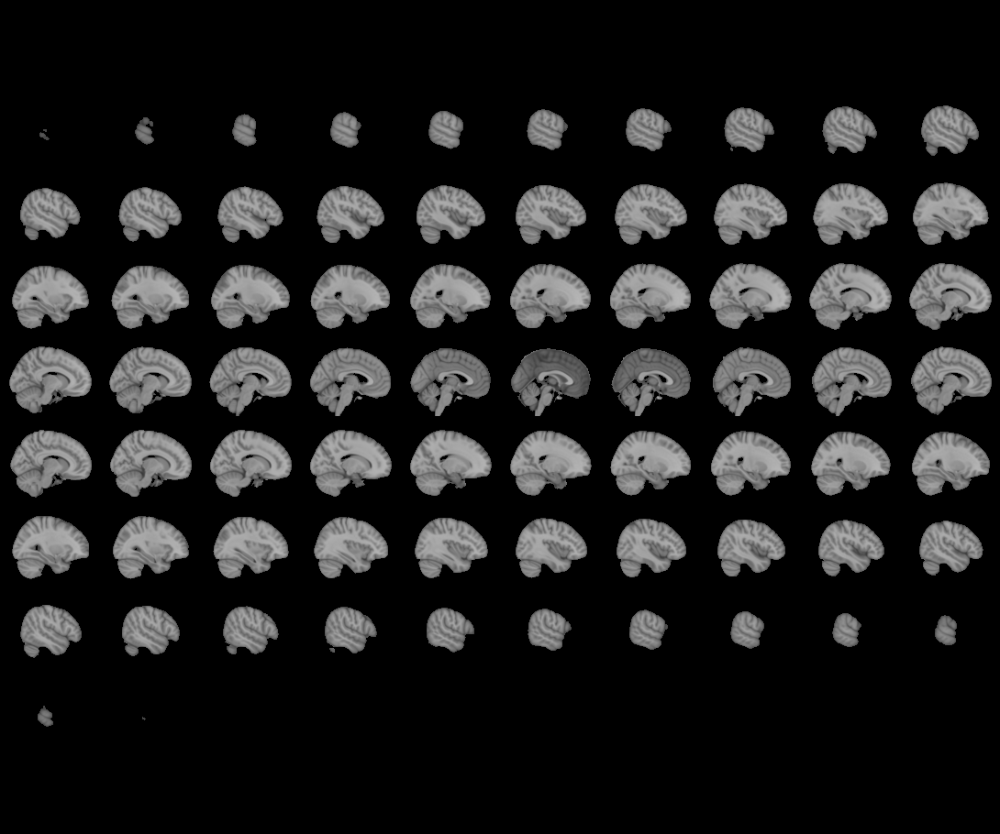
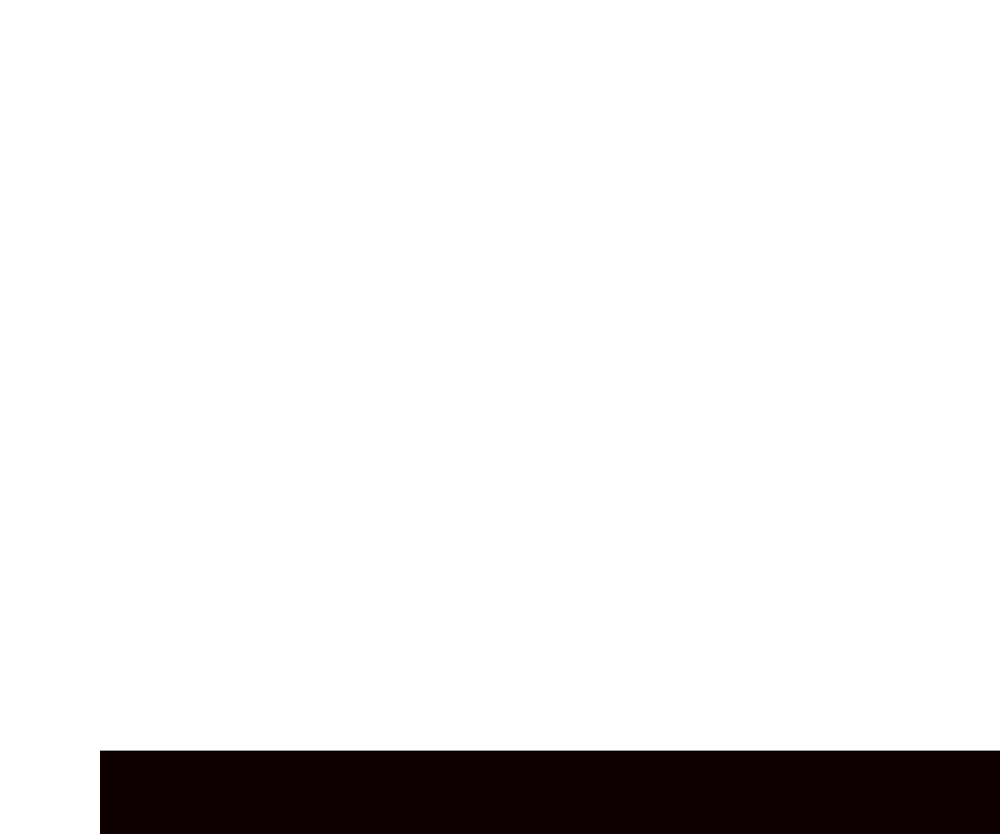

In [45]:
roi_img = nib.Nifti1Image(roi_tem1, affine = d.affine, header = d.header)
resam_mask = resample_to_img(roi_img , int_mask, interpolation='nearest')
view_img(roi_img)


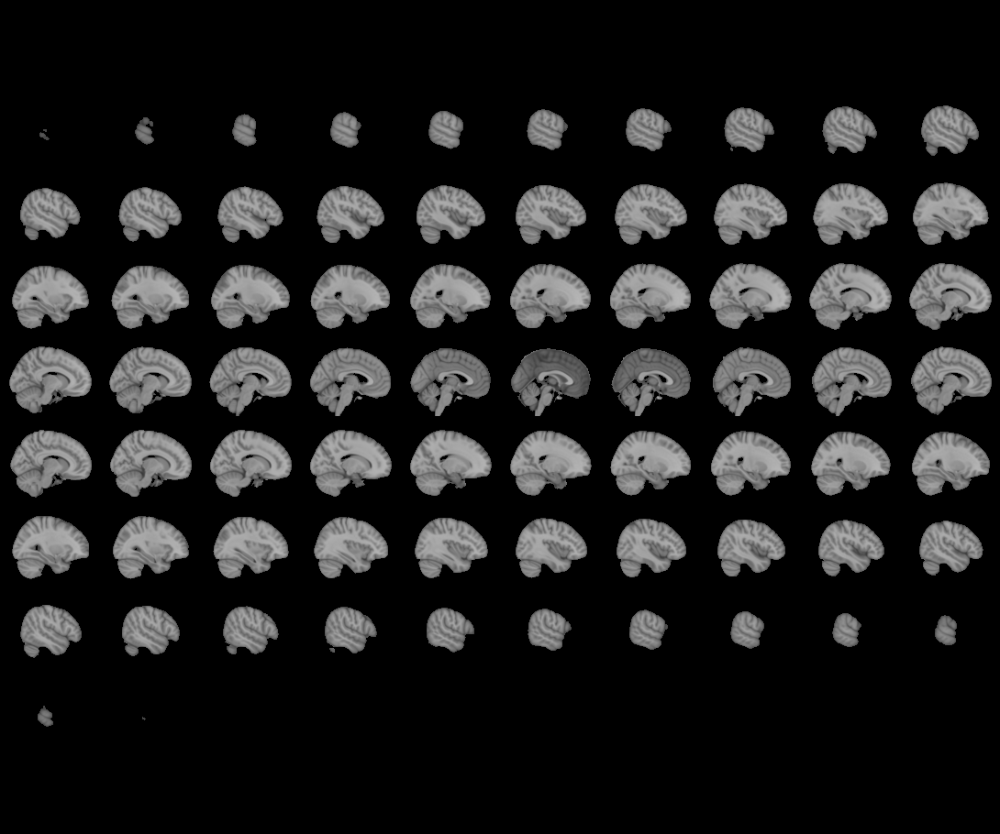
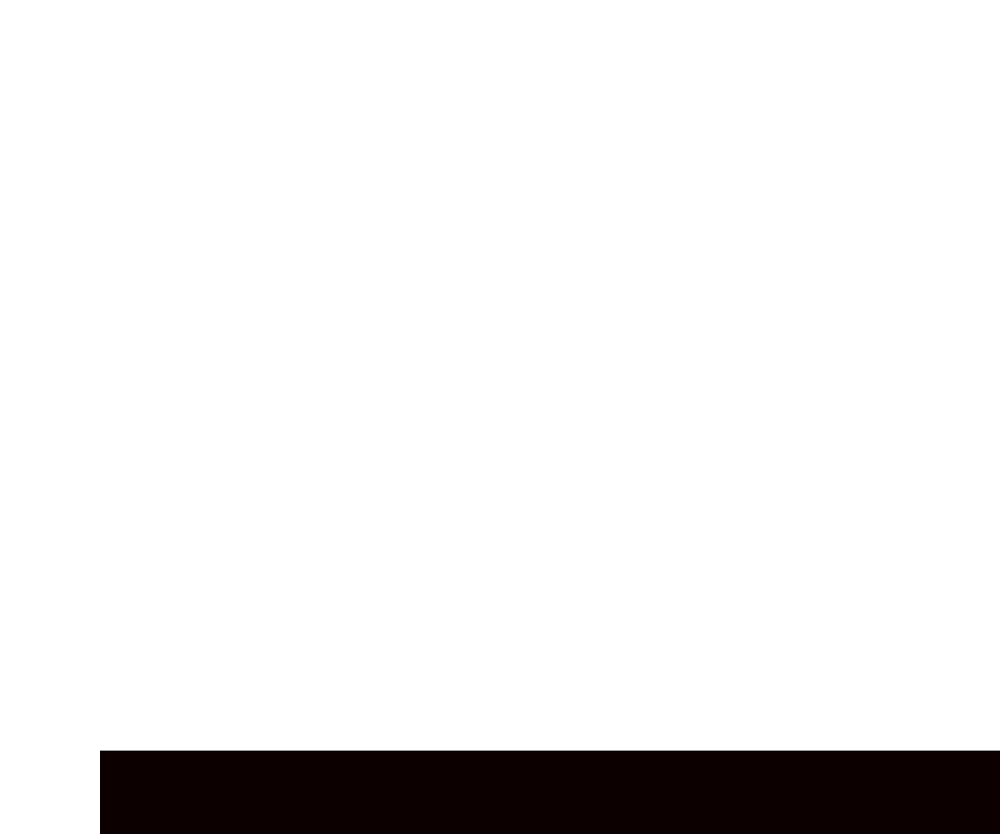

In [33]:
roi_img = nib.Nifti1Image(roi_tem1, affine = d.affine, header = d.header)
view_img(roi_img)

In [41]:
resam_mask.shape

(78, 93, 65)

In [35]:
fmri_imgs = load_smsc_fmri('sub-000',behav_p,cond_a,cond_b,suffix)

concatenated SM SC


In [46]:
nifti_masker = NiftiMasker(mask_img=resam_mask)
maskedData = nifti_masker.fit_transform(fmri_imgs[0])
maskedData.shape

(205, 56497)

In [47]:
nib.save(resam_mask,'/jukebox/graziano/coolCatIsaac/ATM/data/work/workspace/shaef_gm_MNI_mask.nii')



# start

In [14]:
# LOAD MASK for resampling
int_mask = nib.load('/jukebox/graziano/coolCatIsaac/ATM/data/work/workspace/load_fcma/mask_10r_n22-subs.nii.gz')

In [ ]:
# Find intersection - can also try union

In [16]:
yoz = []
for sub in sub_list:
    print(sub)
    
    mask_dir = '/jukebox/graziano/coolCatIsaac/ATM/data/bids/derivatives/fmriprep/'+sub+'/ses-01/anat/'
    int_mask4 = nib.load(os.path.join(mask_dir, '%s_ses-01_space-MNI152NLin2009cAsym_label-GM_probseg.nii.gz')
                        %(sub))
    #raw_pseg = nib.load(os.path.join(mask_dir, '%s_ses-01_space-MNI152NLin2009cAsym_label-GM_probseg.nii.gz')
     #                   %(sub))
    #int_mask4 = resample_to_img(raw_pseg , int_mask, interpolation='nearest')
    aparc = int_mask4.get_fdata()
    calc_mask = np.zeros(aparc.shape)
    calc_mask[aparc > .01] = 1
    calc_mask_img = nib.Nifti1Image(calc_mask, affine=int_mask4.affine, header=int_mask4.header)
    resam_mask = resample_to_img(calc_mask_img , int_mask, interpolation='nearest')
    yoz.append(resam_mask)
    
intersect_mask = nil.masking.intersect_masks(yoz, threshold=1)
print('done', intersect_mask.shape)
    

sub-000
sub-001
sub-002
sub-003
sub-004
sub-005
sub-006
sub-007
sub-008
sub-009
sub-010
sub-011
sub-012
sub-013
sub-014
sub-015
sub-016
sub-017
sub-018
sub-019
sub-020
sub-021
done (78, 93, 65)


In [25]:
intersect_mask = nil.masking.intersect_masks(yoz, threshold=.6)

In [103]:
nib.save(intersect_mask,'/jukebox/graziano/coolCatIsaac/ATM/data/work/workspace/load_fcma/inter_allsubs_.01postresamp_MNI.nii')



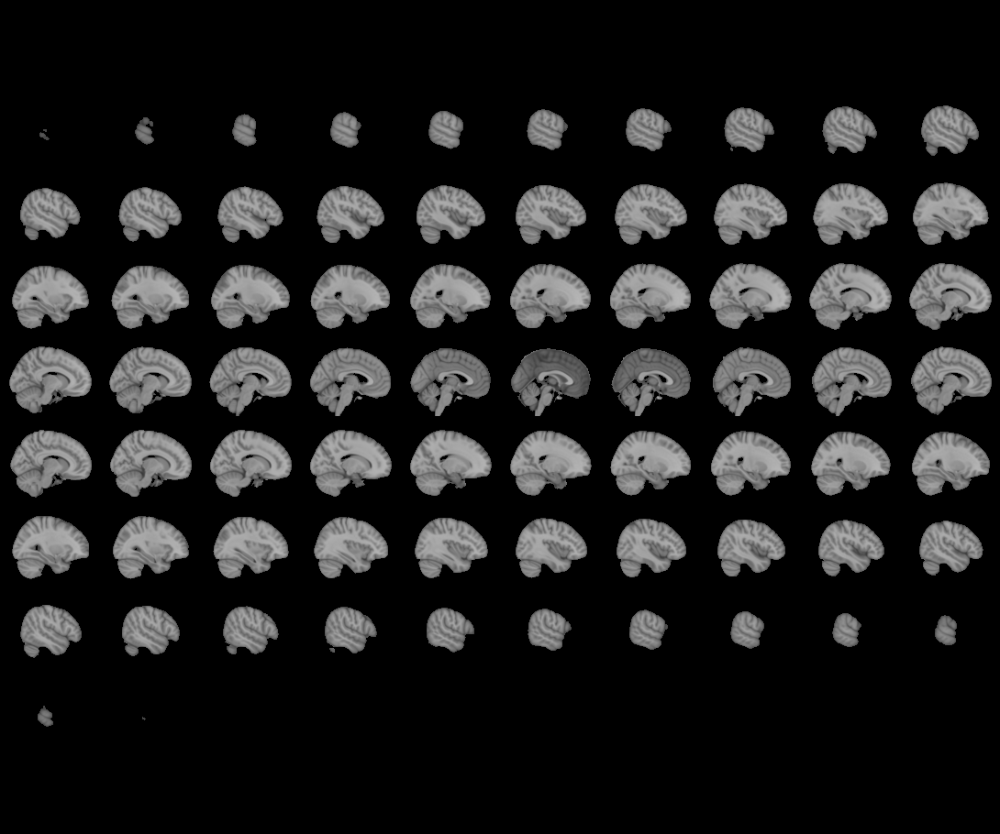
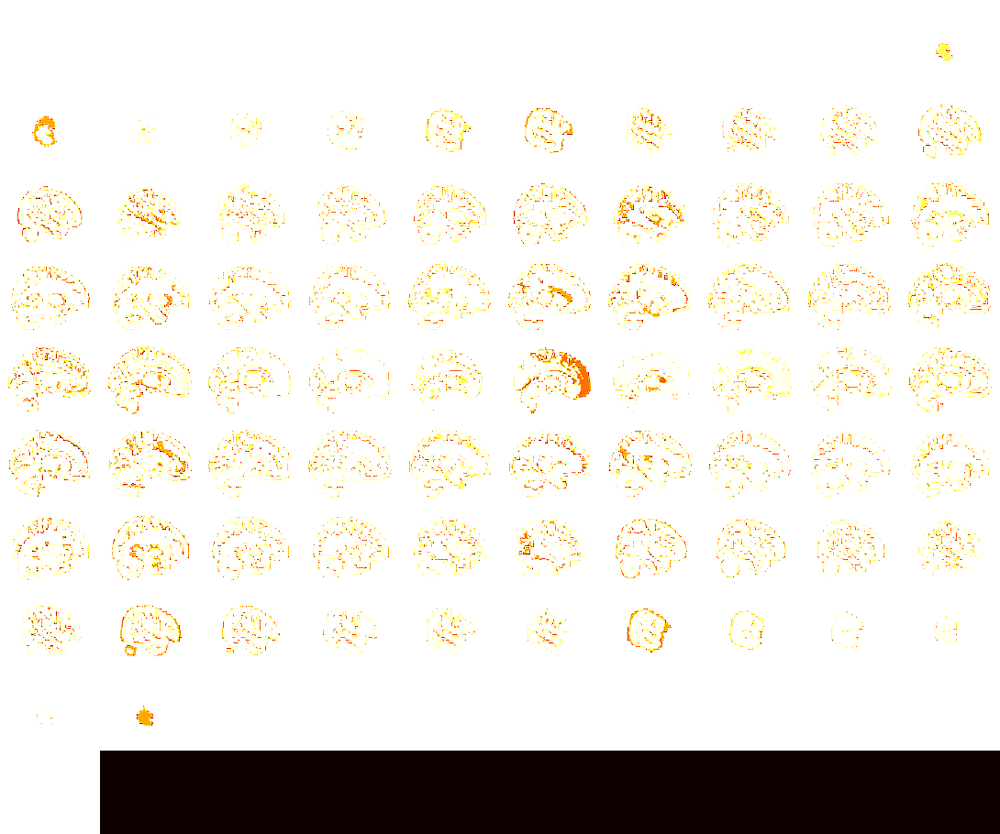

In [26]:
# intersection = .6
view_img(intersect_mask)


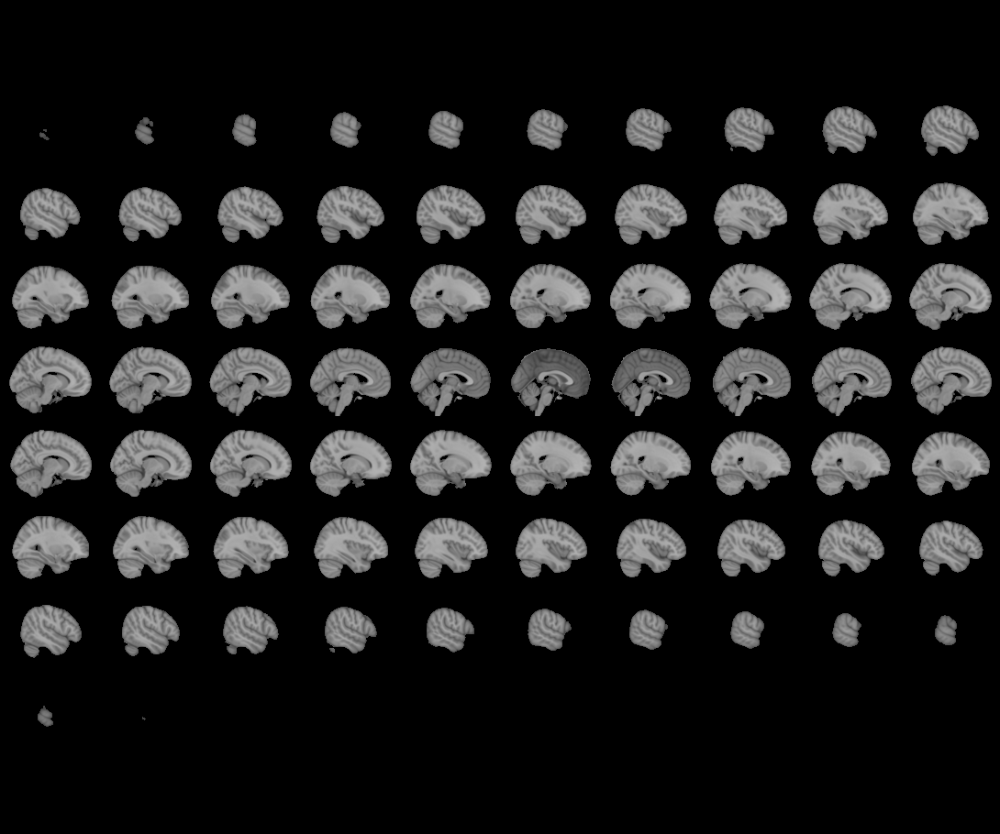
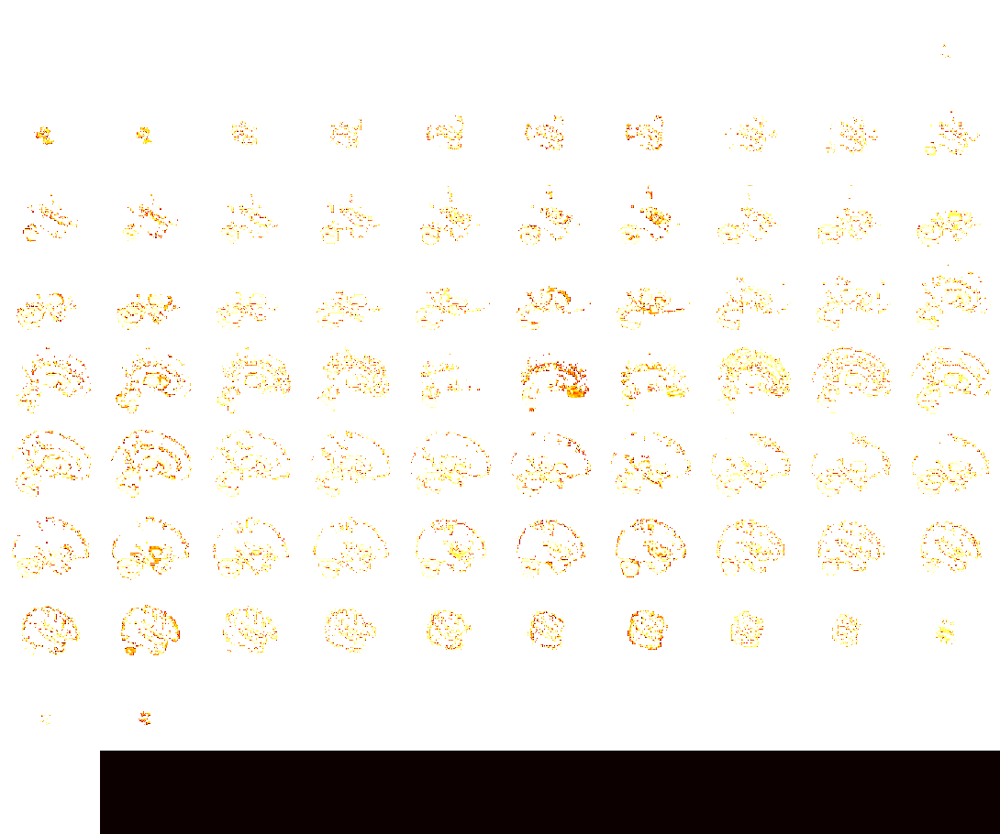

In [24]:
# intersection = 1
view_img(intersect_mask)


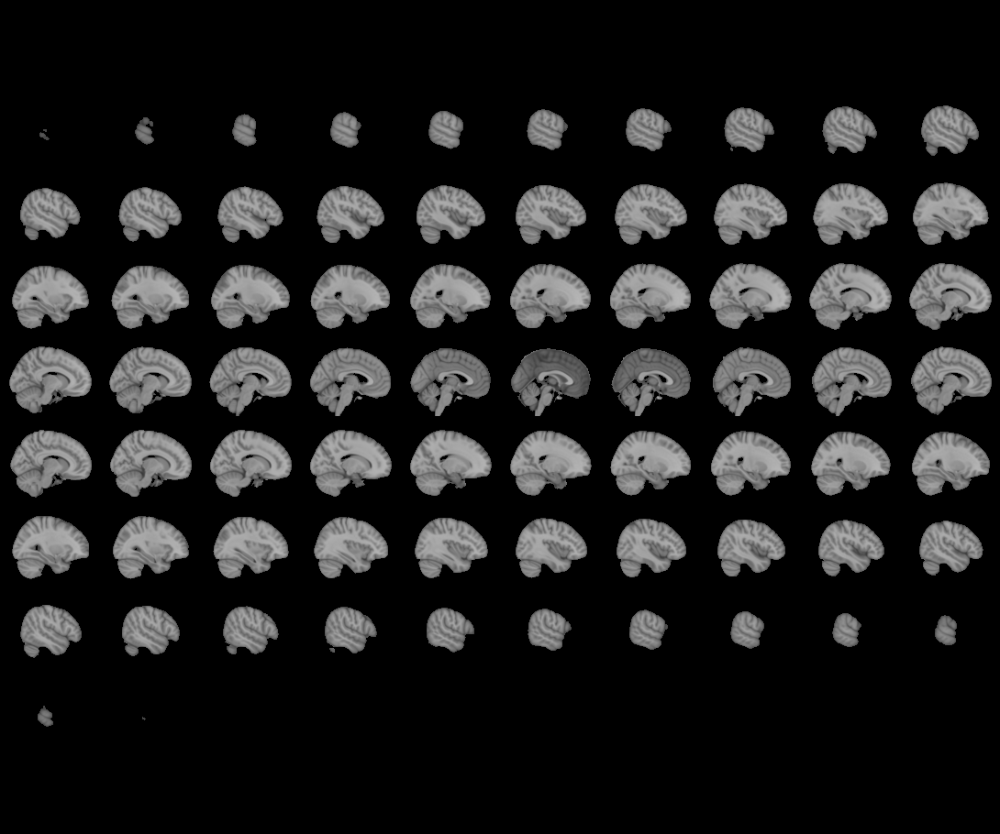
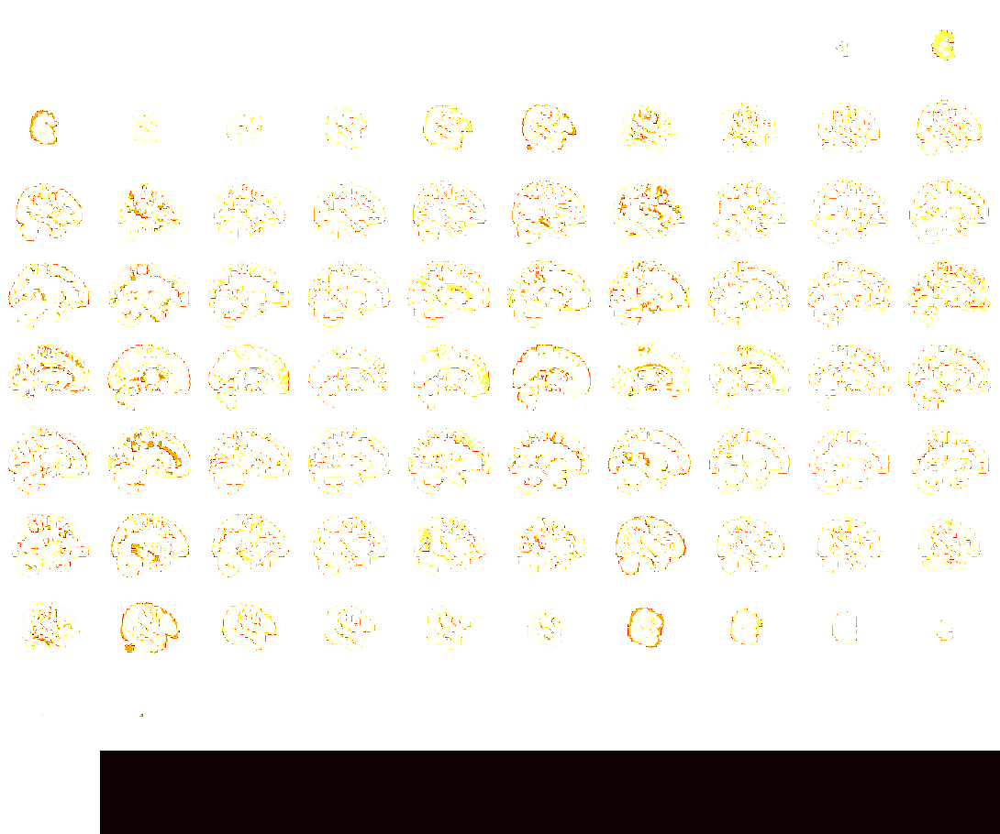

In [94]:
# union of all voxels with greater than .01 prob of being grey matter from dseg...
view_img(intersect_mask)


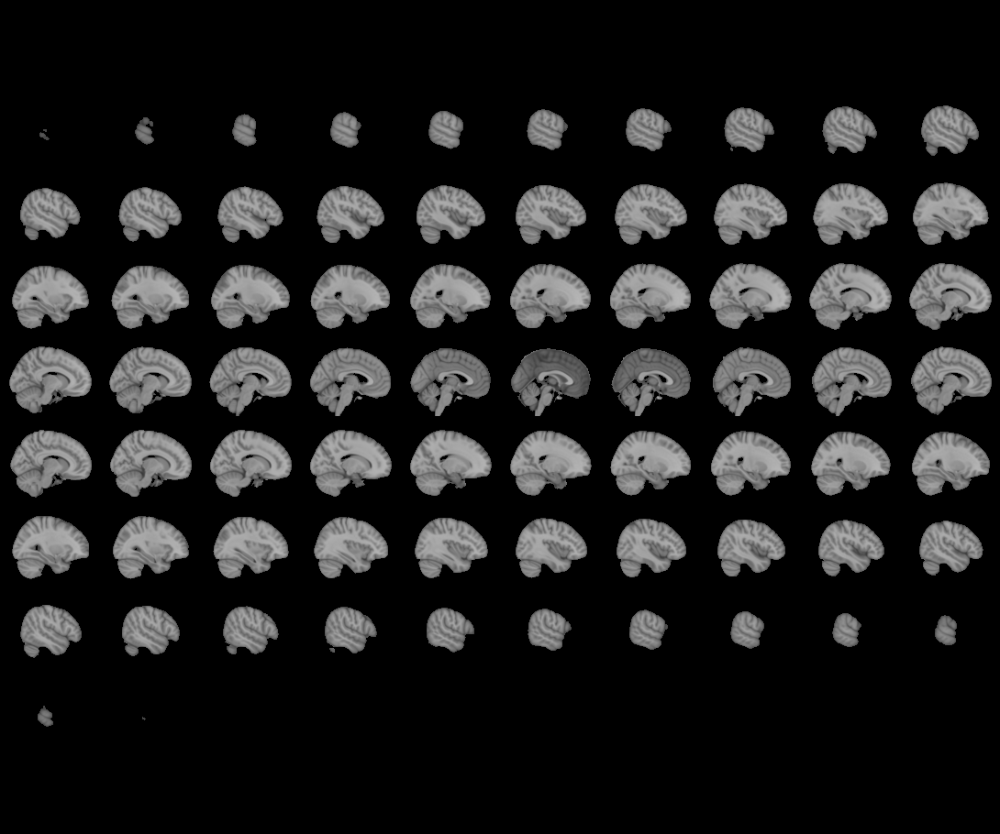
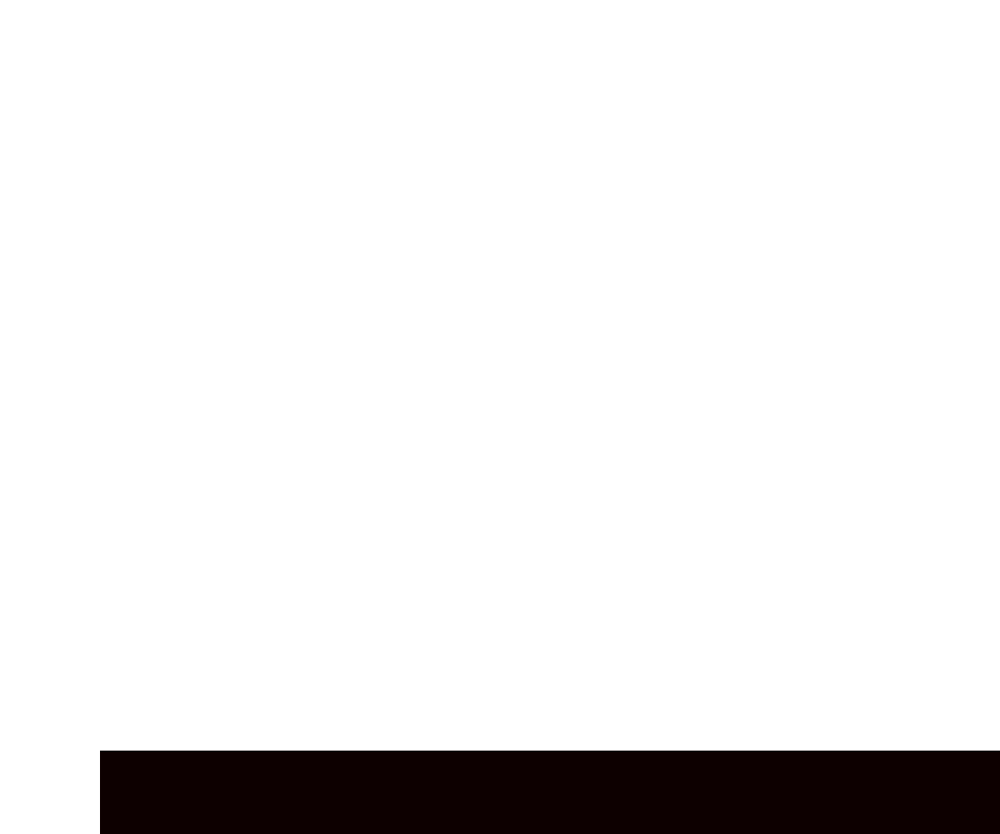

In [89]:
# union of all voxels with greater than .01 prob of being grey matter from dseg...
view_img(intersect_mask)


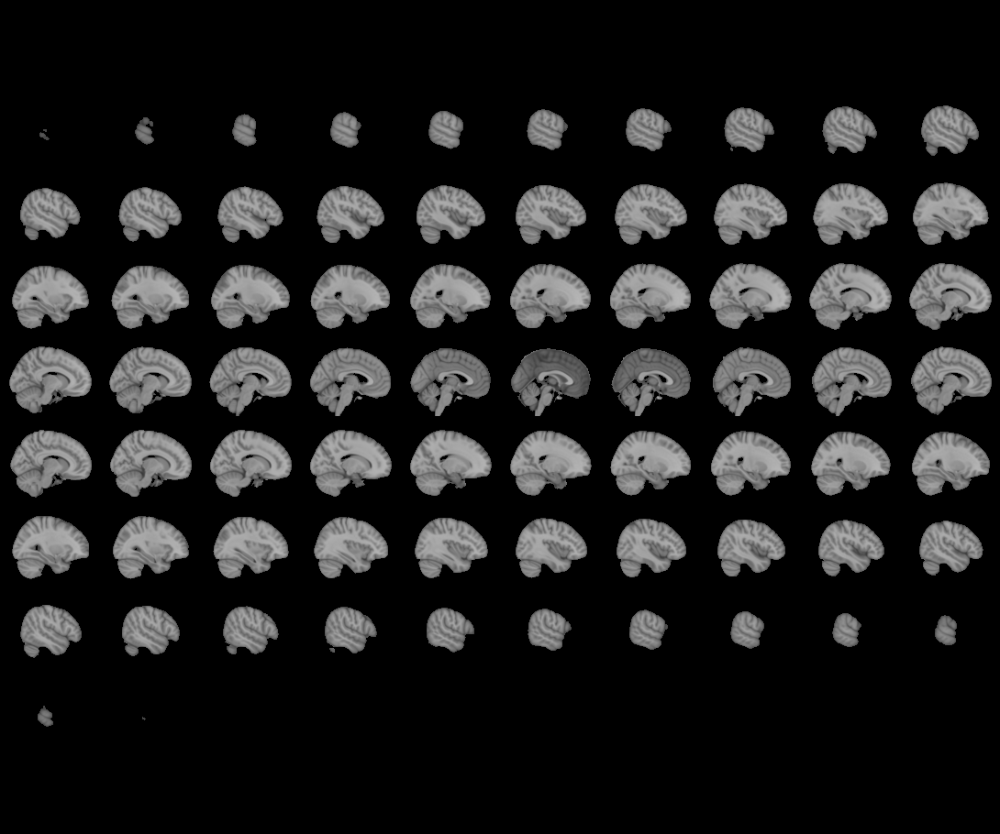
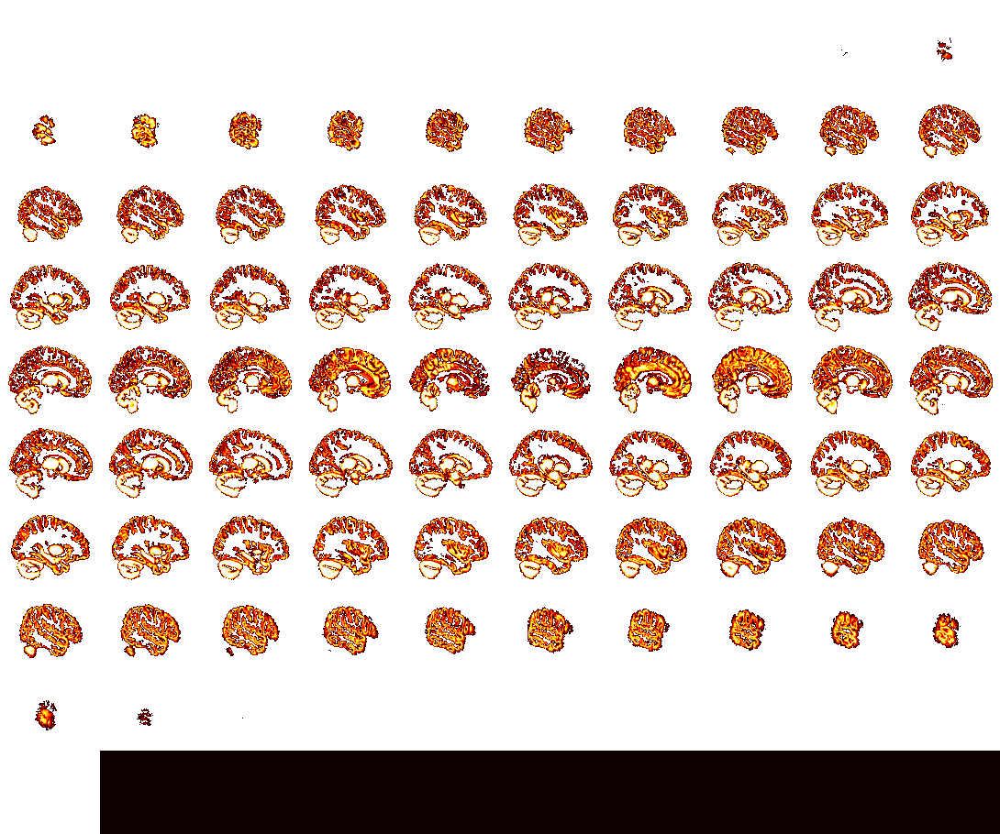

In [83]:
# subject one grey matter 
view_img(yoz[0])


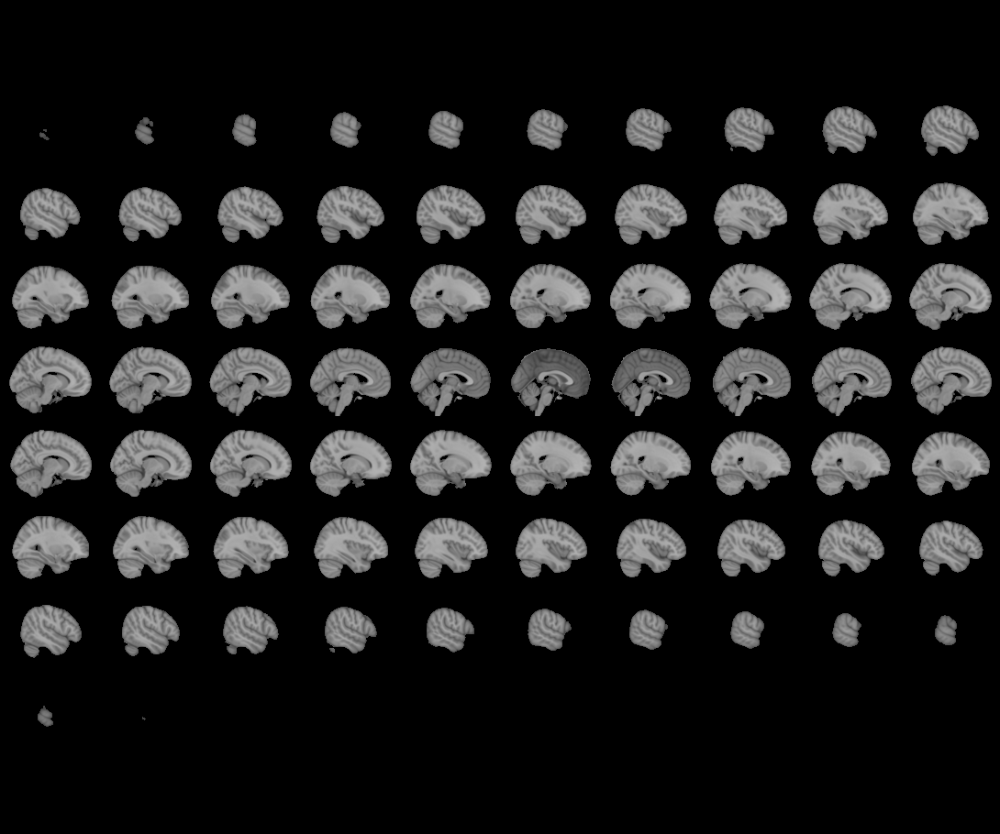
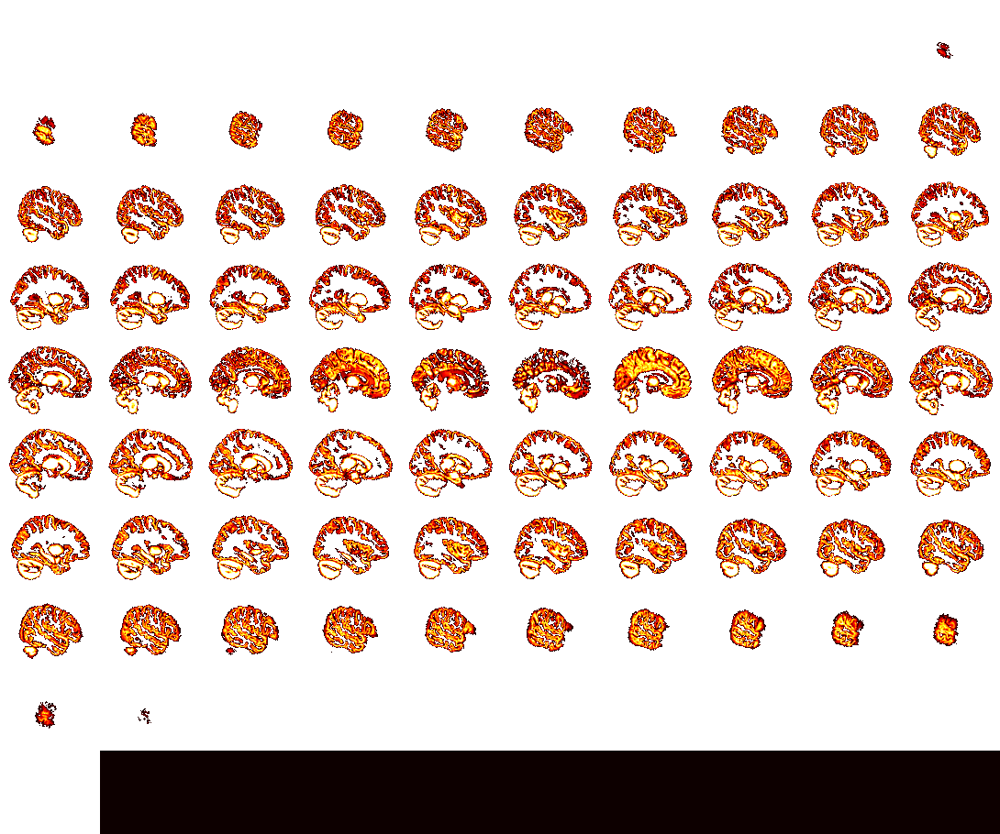

In [87]:
# subject 2 grey matter 
view_img(yoz[1])

In [17]:
fmri_imgs = load_smsc_fmri(sub,behav_p,cond_a,cond_b,suffix)

concatenated SM SC


In [18]:
fmri_imgs[0]

In [28]:
nifti_masker = NiftiMasker(mask_img=intersect_mask)
maskedData = nifti_masker.fit_transform(fmri_imgs[0])

In [23]:
# one sub gm mask INTERSECTION @ 1
maskedData.shape

(205, 29286)

In [29]:
# one sub gm mask UNION @ .6
maskedData.shape

(205, 73075)

In [20]:
# one sub gm mask UNION
maskedData.shape

(205, 98086)

In [74]:
# one sub gm mask
maskedData.shape

(205, 59619)

In [91]:
# multiple subs gm mask
maskedData.shape

(205, 1442520)

In [98]:
# multiple subs gm mask resample BEFORE
maskedData.shape

(205, 74117)

In [101]:
# multiple subs gm mask resample AFTER
maskedData.shape

(205, 77102)

In [ ]:
# pretty big reduction from 92000. should help out multiple comparison

In [92]:
yoz[0].shape

(193, 229, 193)

In [21]:
int_mask.shape

(78, 93, 65)

In [ ]:
epi = resample_to_img(bad_epi , good_epi, interpolation='nearest')

In [72]:
resam_mask = resample_to_img(calc_mask_img , int_mask, interpolation='nearest')


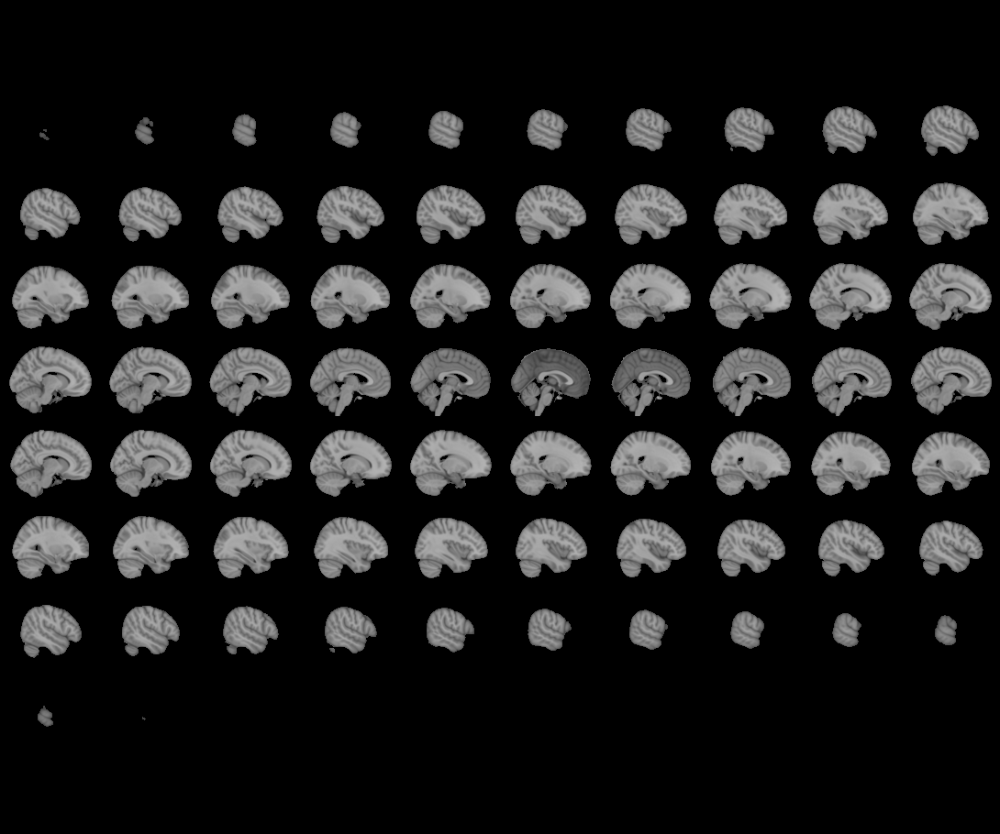
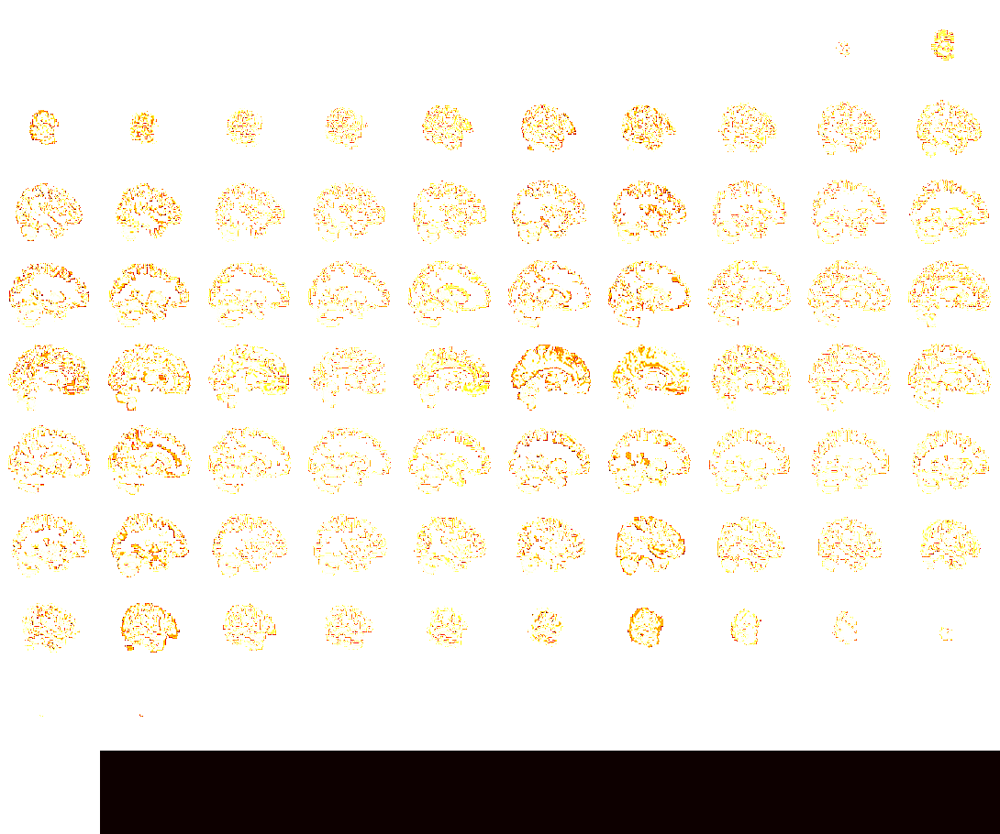

In [48]:
view_img(epi)


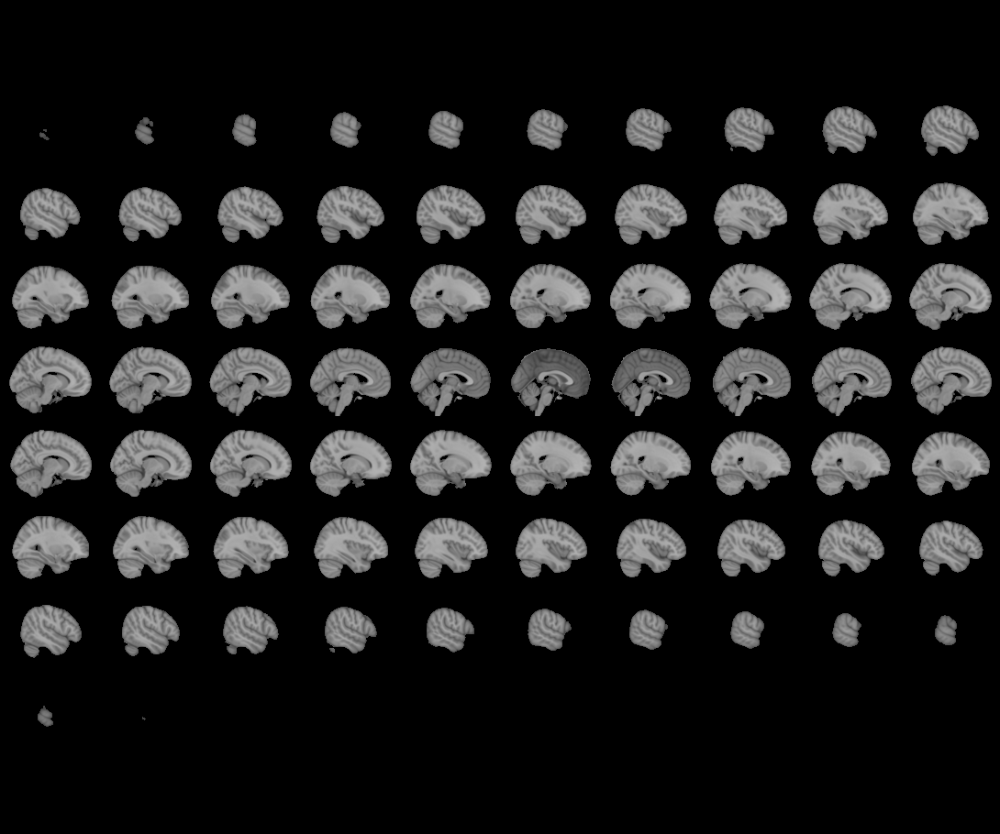
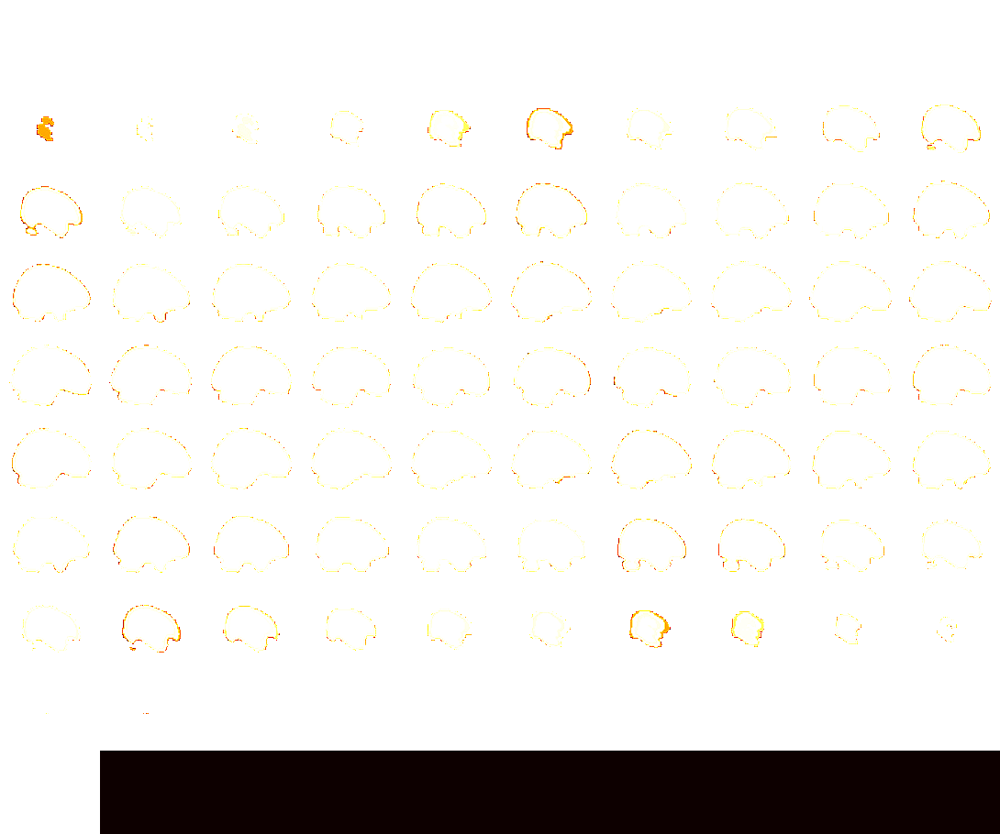

In [9]:
from nilearn.plotting import plot_roi
view_img(int_mask)

In [10]:
int_mask2 = nib.load('/jukebox/graziano/coolCatIsaac/ATM/data/work/rois/mni_icbm152_gm_tal_nlin_sym_09a.nii')


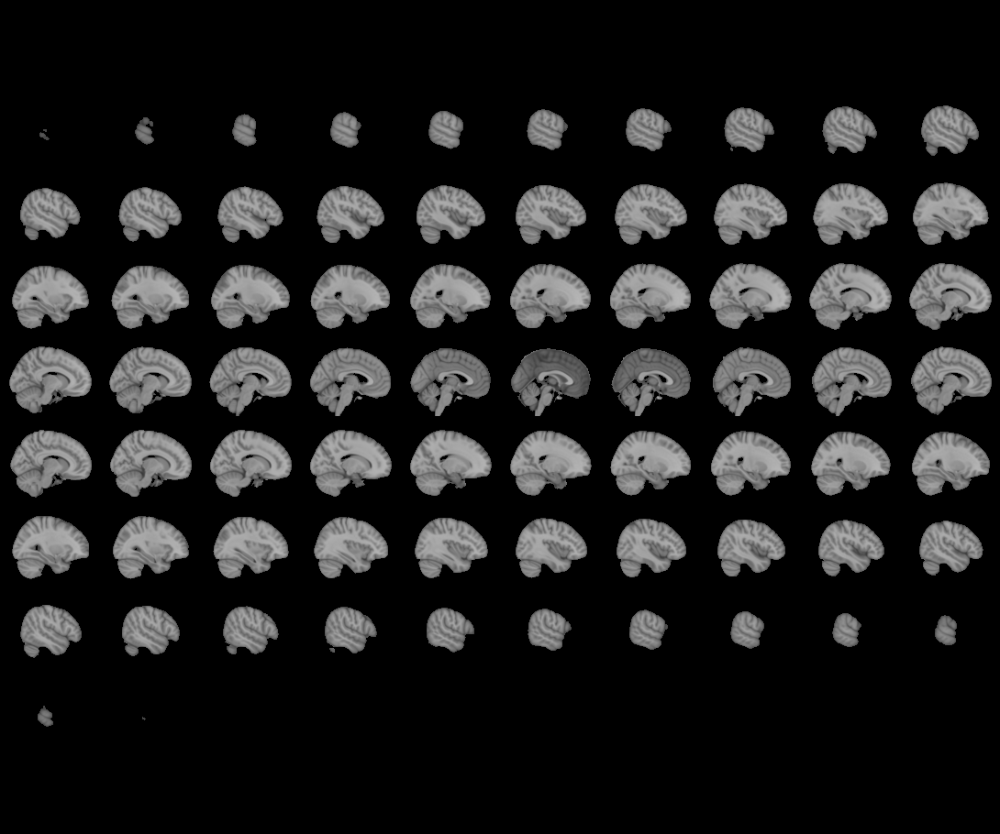
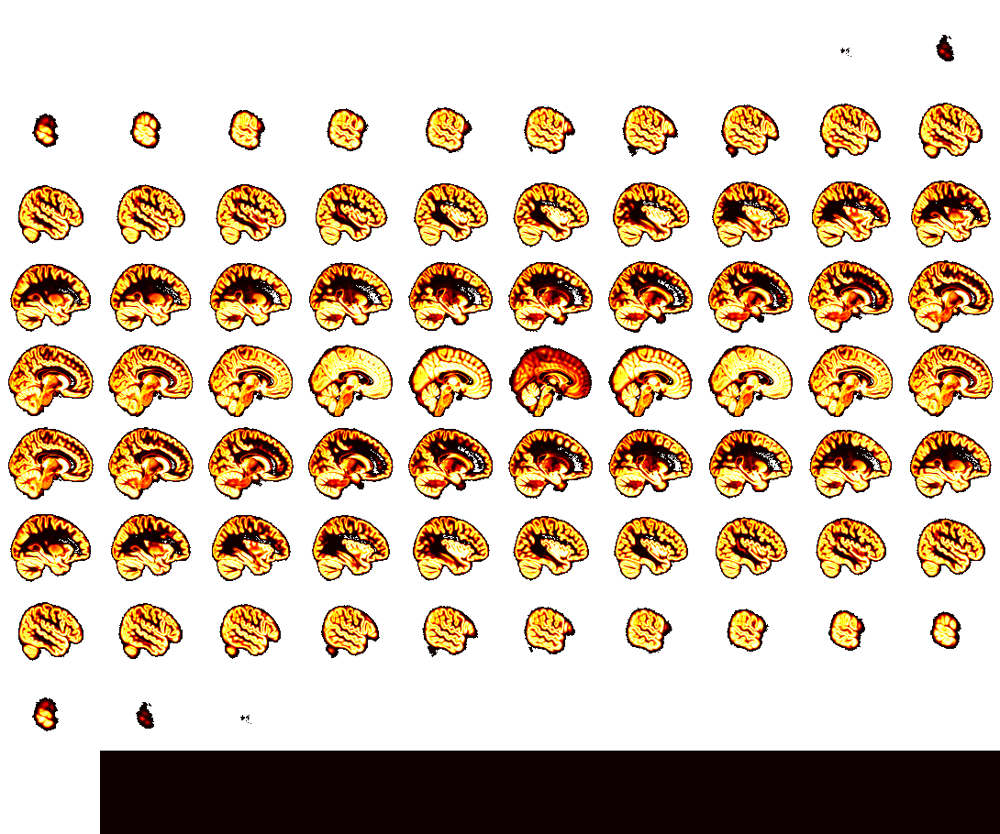

In [11]:
view_img(int_mask2)

In [12]:
aparc = int_mask2.get_fdata()

In [13]:
aparc.shape

(197, 233, 189)

In [ ]:
os.path.join(mask_dir, 'sub-000_ses-01_space-MNI152NLin2009cAsym_label-GM_probseg.nii.gz')

In [15]:
mask_dir = '/jukebox/graziano/coolCatIsaac/ATM/data/bids/derivatives/fmriprep/sub-000/ses-01/anat/'

In [ ]:
int_mask2 = nib.load('/jukebox/graziano/coolCatIsaac/ATM/data/work/rois/mni_icbm152_gm_tal_nlin_sym_09a.nii')

In [16]:
int_mask3 = nib.load(os.path.join(mask_dir, 'sub-000_ses-01_space-MNI152NLin2009cAsym_label-GM_probseg.nii.gz'))


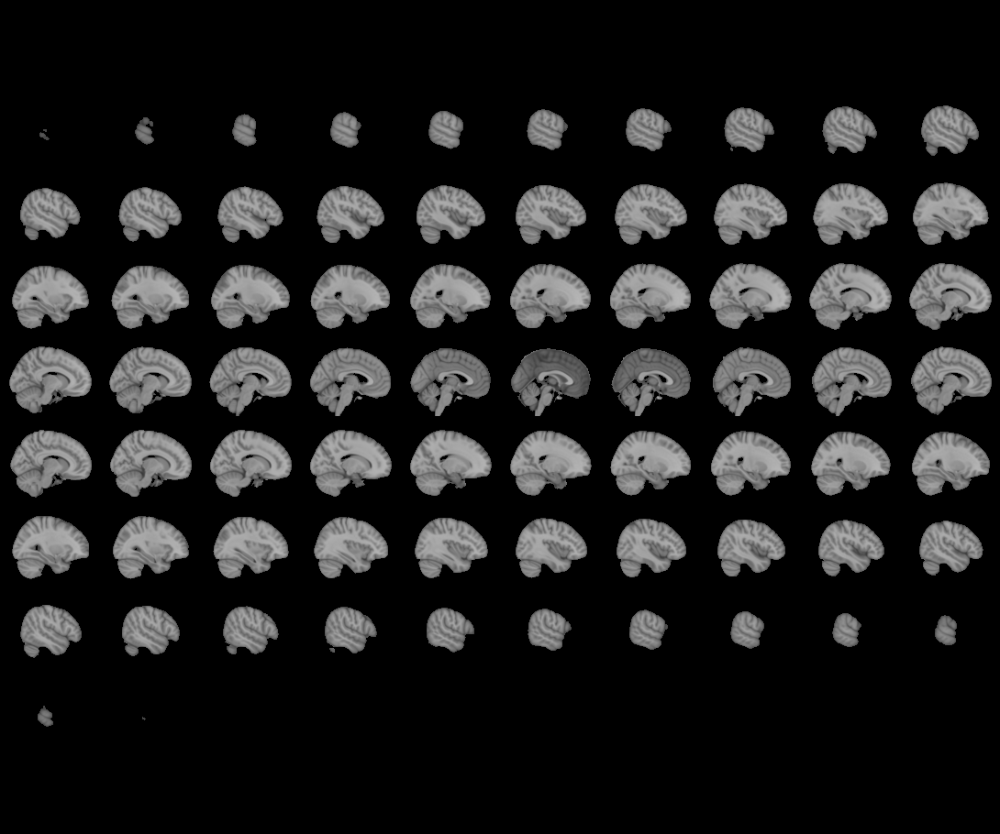
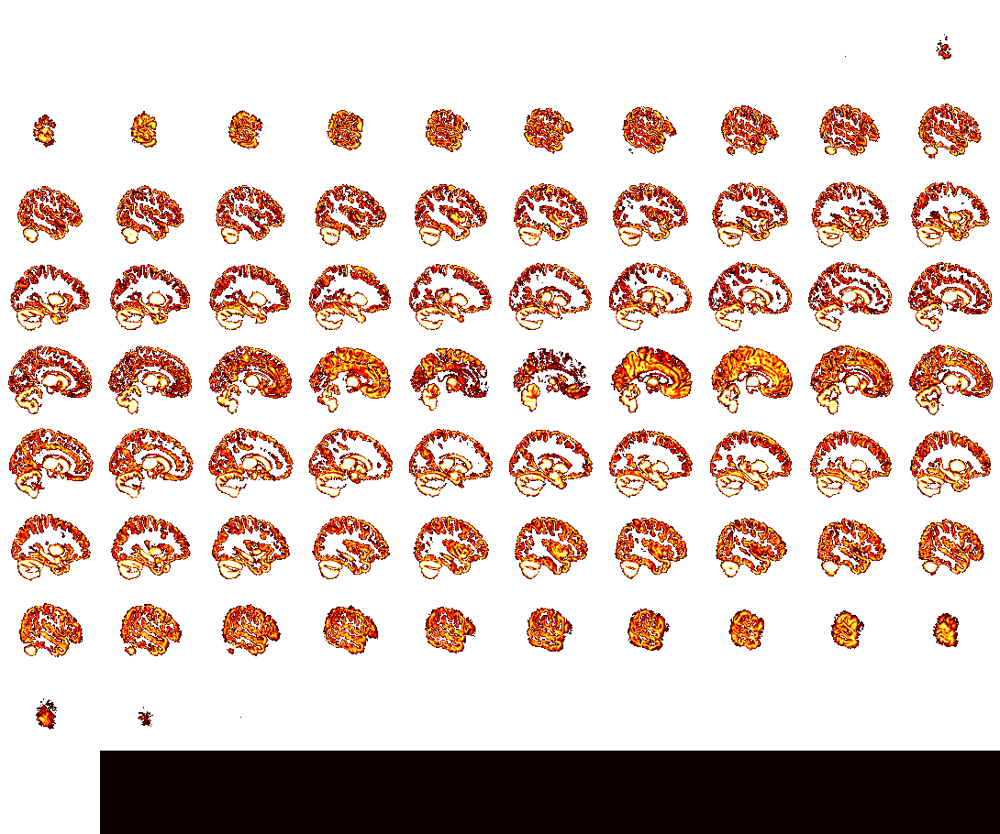

In [17]:
view_img(int_mask3)

In [40]:
aparc = int_mask3.get_fdata()
calc_mask = np.zeros(aparc.shape)
calc_mask[aparc > .01] = 1
calc_mask_img = nib.Nifti1Image(calc_mask, affine=int_mask2.affine, header=int_mask2.header)

In [45]:
int_mask3.shape

(193, 229, 193)

In [41]:
calc_mask = np.zeros(aparc.shape)

In [42]:
calc_mask[aparc > .1] = 1

In [43]:
calc_mask_img = nib.Nifti1Image(calc_mask, affine=int_mask2.affine, header=int_mask2.header)


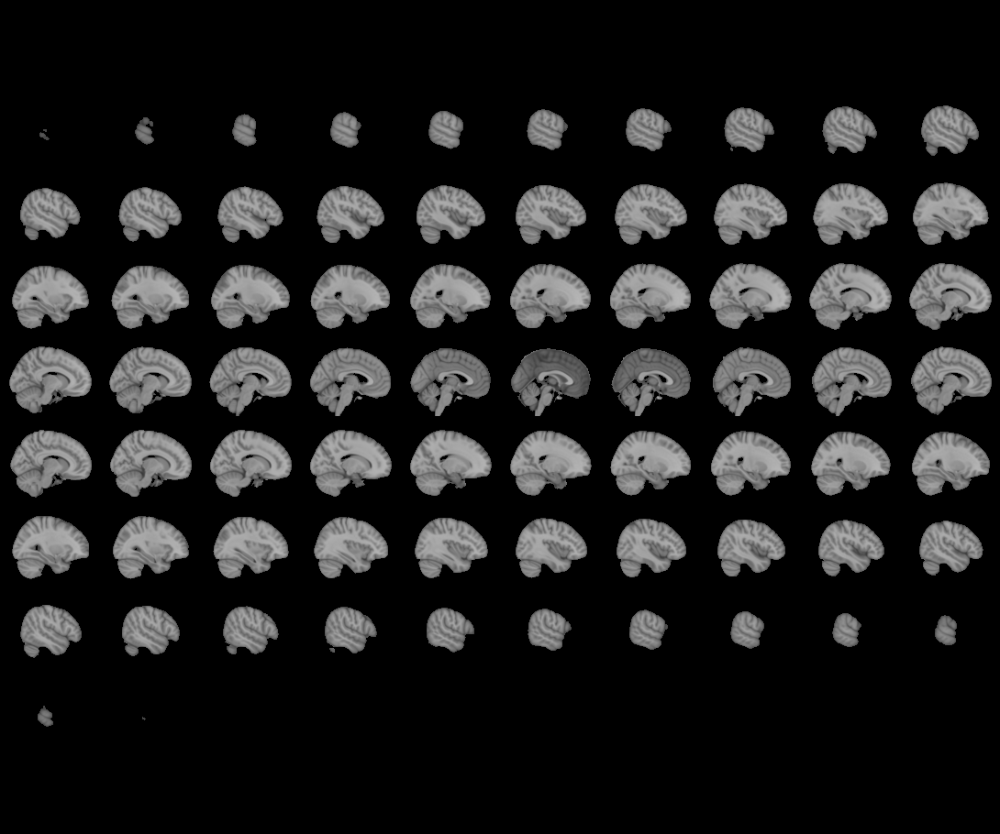
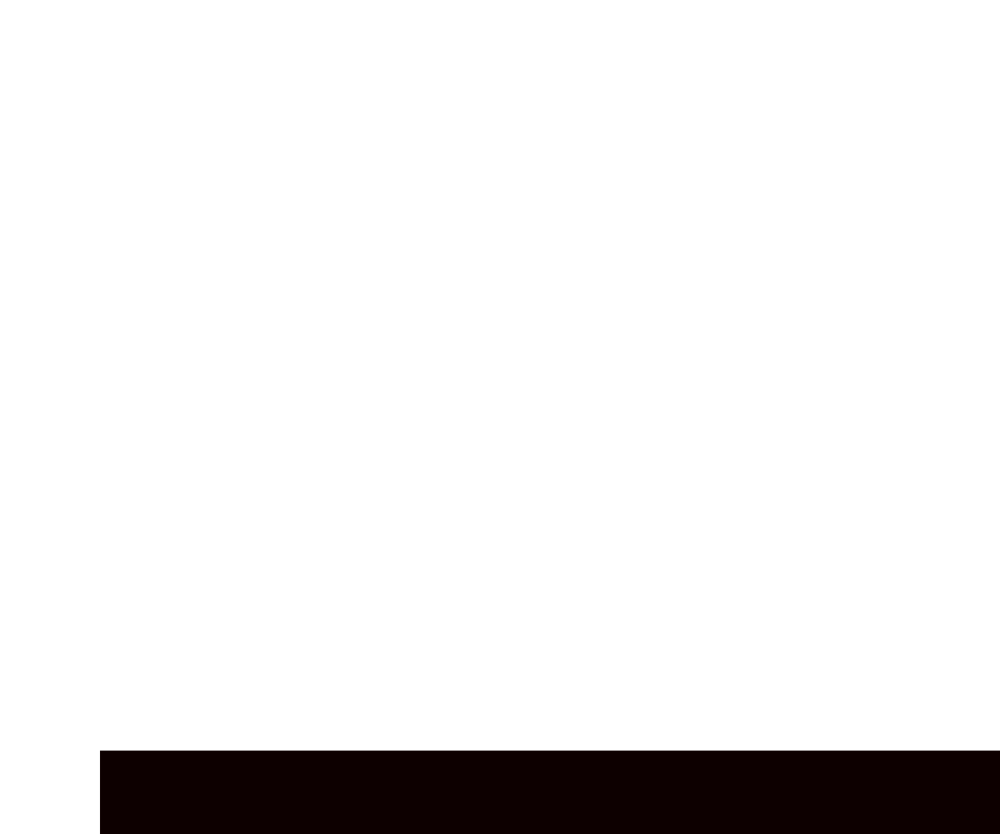

In [44]:
view_img(calc_mask_img)

In [61]:
from nilearn.masking import compute_brain_mask
mask_img = compute_brain_mask(int_mask,threshold=0.5, connected=True, opening=2, memory=None, 
                              verbose=0, mask_type='whole-brain')

TypeError: compute_brain_mask() got an unexpected keyword argument 'mask_type'

In [58]:
mask_img = intersect_mask('sub-000', 2, 'MNI')

Begin intersecting, you sexy beast
Loading data from /jukebox/graziano/coolCatIsaac/ATM/data/bids/derivatives/fmriprep/sub-000/ses-01/func/sub-000_ses-01_task-Attn_run-1_space-MNI152NLin2009cAsym_desc-preproc_bold.nii.gz


TypeError: compute_epi_mask() got an unexpected keyword argument 'mask_type'


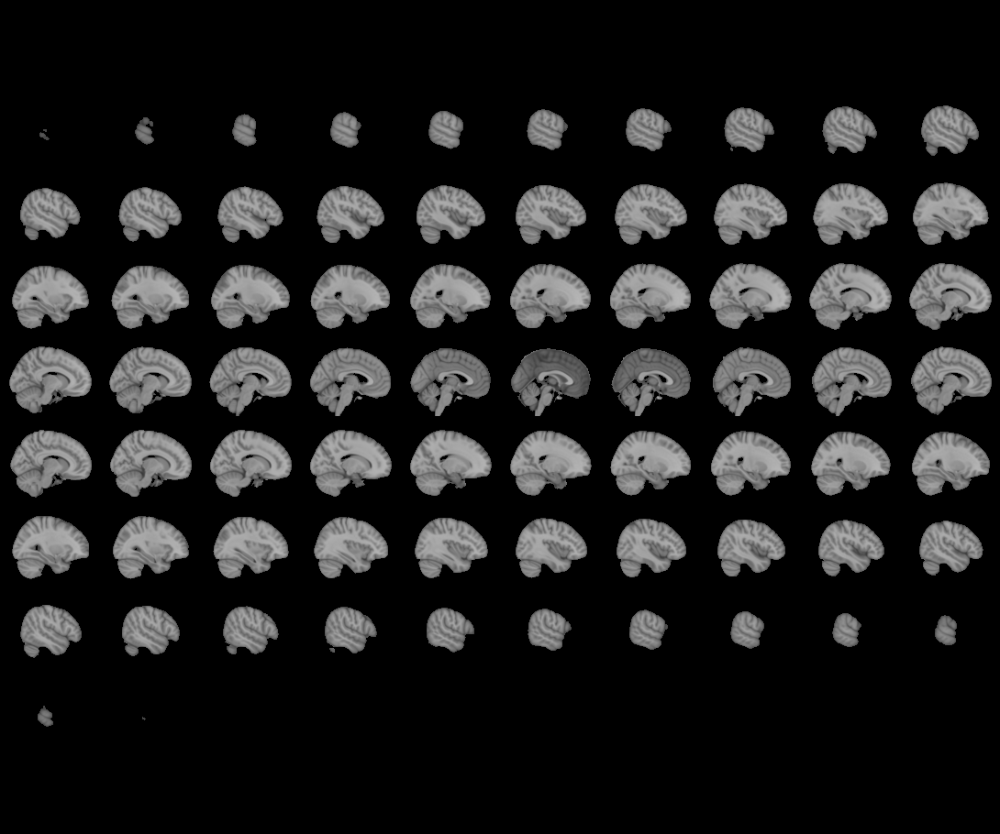
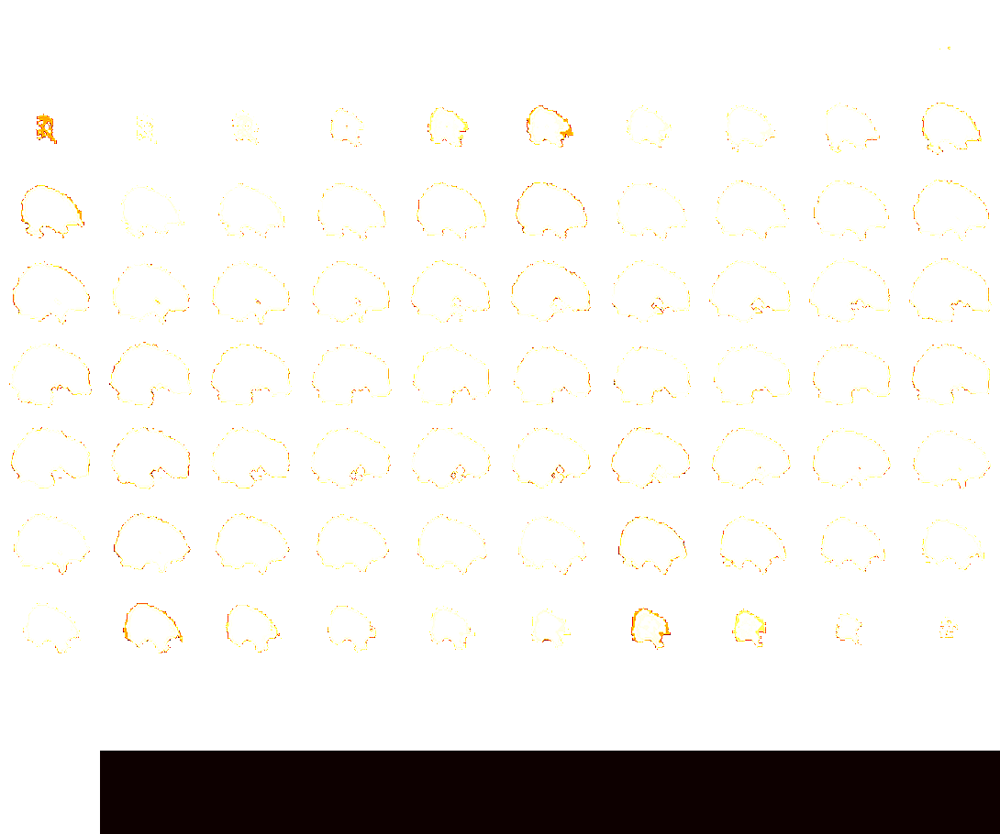

In [56]:
view_img(mask_img)

In [ ]:
"""
try to install newest version of nilearn. the pyger module is old. ASK PYGERS
https://nilearn.github.io/stable/introduction.html#installation
"""

In [1]:
!pip show nilearn

Name: nilearn
Version: 0.7.1
Summary: Statistical learning for neuroimaging in Python
Home-page: http://nilearn.github.io
Author: None
Author-email: None
License: new BSD
Location: /mnt/cup/PNI-facilities/Computing/sw/pkg/SD6/PYGER/base/envs/0.11.0/lib/python3.7/site-packages
Requires: nibabel, scikit-learn, scipy, numpy, requests, joblib, pandas
Required-by: 


In [ ]:
#https://nilearn.github.io/modules/generated/nilearn.masking.compute_brain_mask.html#nilearn.masking.compute_brain_mask

In [ ]:
https://nilearn.github.io/modules/generated/nilearn.input_data.NiftiMasker.html
    https://nilearn.github.io/modules/generated/nilearn.input_data.NiftiSpheresMasker.html#nilearn.input_data.NiftiSpheresMasker